# HW11. Методы понижения размерности.
#### Ильичёв А.С., 693

In [1]:
import numpy as np
import math as m
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as sts
import pandas as pd
from statsmodels.stats.multitest import multipletests
import statsmodels as sm
from tqdm import tqdm
import scipy.interpolate as interp
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.model_selection import cross_val_score, KFold, GridSearchCV, train_test_split
from sklearn.metrics import mean_squared_error, make_scorer, accuracy_score
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
import sklearn.decomposition as decomp
from sklearn.datasets import fetch_olivetti_faces
from sklearn.manifold import TSNE, LocallyLinearEmbedding, Isomap, MDS
from sklearn.neighbors import KNeighborsClassifier




%matplotlib inline

plt.rcParams['figure.figsize'] = (10, 5) 

# Задача 2

In [2]:
df = pd.read_excel('hw11t2_train.xlsx')
df = df.rename(columns=df.iloc[0]).drop(0, 0).astype('float')
df.head()

,START YEAR,START QUARTER,COMPLETION YEAR,COMPLETION QUARTER,V-1,V-2,V-3,V-4,V-5,V-6,...,V-22,V-23,V-24,V-25,V-26,V-27,V-28,V-29,V-9,V-10
1,81.0,1.0,85.0,1.0,1.0,3150.0,920.0,598.5,190.0,1010.84,...,815.50,1755.00,8002.0,60.74,54.26,2978.26,41407.0,601988.1,2200.0,410.0
2,84.0,1.0,89.0,4.0,1.0,7600.0,1140.0,3040.0,400.0,963.81,...,1316.30,8364.78,8393.0,90.95,89.79,11379.37,44835.0,929027.1,5000.0,1000.0
3,78.0,1.0,81.0,4.0,1.0,4800.0,840.0,480.0,100.0,689.84,...,765.80,1755.00,4930.0,38.70,32.04,1653.06,37933.0,377828.6,1200.0,170.0
4,72.0,2.0,73.0,2.0,1.0,685.0,202.0,13.7,20.0,459.54,...,152.25,1442.31,1456.0,9.73,8.34,686.16,8194.0,122031.7,165.0,30.0
5,87.0,1.0,90.0,2.0,1.0,3000.0,800.0,1230.0,410.0,631.91,...,2244.10,9231.76,9286.0,136.60,140.20,9821.00,48260.0,1734973.5,5500.0,700.0


In [3]:
print(df.columns[12])

V-11


Признаки `V-11` - `V-29` представлены для 5 разных временных точек. Обучим на PCA-компонентах Ridge-регрессию, подобрав число компонент и параметр регуляризации по кросс-валидации.

In [4]:
train_df = df[df['V-9'].notnull()]
len(train_df)

275

In [5]:
test_df = df[~df['V-9'].notnull()]
len(test_df)

97

In [6]:
comps = np.arange(5, 107, 5)
comps

array([  5,  10,  15,  20,  25,  30,  35,  40,  45,  50,  55,  60,  65,
        70,  75,  80,  85,  90,  95, 100, 105])

In [7]:
def rmse(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))


rmse_scorer = make_scorer(rmse, greater_is_better=False)

scaler = StandardScaler()
pca = decomp.PCA(random_state=1)
model = Ridge(random_state=1)
pipeline = Pipeline(steps=[('scaler', scaler),
                           ('pca', pca),
                           ('lr', model)])
params = {
    'pca__n_components': comps,
    'lr__alpha': np.logspace(-3, 2, 6)
} 

gsearch = GridSearchCV(pipeline, params, scoring=rmse_scorer, verbose=1, cv=5, n_jobs=-1, iid=False)

In [8]:
X_train = train_df.drop(['V-9', 'V-10'], 1)
v9_train = train_df['V-9']
v10_train = train_df['V-10']

In [9]:
gsearch.fit(X_train, v9_train.astype('float'))
gsearch.best_params_, -gsearch.best_score_

Fitting 5 folds for each of 126 candidates, totalling 630 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 630 out of 630 | elapsed:    3.5s finished


({'lr__alpha': 1.0, 'pca__n_components': 40}, 180.19824388550416)

Ошибка довольно большая. Попробуем слегка преобразовать данные, рассматривая изменения каждого из повторяющихся признаков относительно его предыдущего значения.

In [10]:
new_df = df.copy()
columns = list(new_df.columns)

In [11]:
n = 5 * 19
n

95

In [12]:
for i in range(n):
    columns[i + 12] = 'V-'+str(11 + i)

In [13]:
new_df.columns = columns
columns[-5:]

['V-103', 'V-104', 'V-105', 'V-9', 'V-10']

In [14]:
for j in range(3, -1, -1):
    for i in range(0, 19):
        k = 19 * j + i + 30
        new_df['V-' + str(k)] = new_df['V-' + str(k)] - new_df['V-' + str(k - 19)]

In [15]:
df['V-29'].head()

,V-29,V-29,V-29,V-29,V-29
1,628132.9,610502.7,589389.6,606524.2,601988.1
2,1188995.8,1067772.0,973523.7,954628.6,929027.1
3,524764.8,466212.2,409677.9,403875.0,377828.6
4,141542.6,129102.4,123618.0,121857.2,122031.7
5,2318397.0,1908975.7,1681849.3,1732937.5,1734973.5


In [16]:
new_df[['V-29', 'V-48', 'V-67', 'V-86', 'V-105']].head()

,V-29,V-48,V-67,V-86,V-105
1,628132.9,-17630.2,-21113.1,17134.6,-4536.1
2,1188995.8,-121223.8,-94248.3,-18895.1,-25601.5
3,524764.8,-58552.6,-56534.3,-5802.9,-26046.4
4,141542.6,-12440.2,-5484.4,-1760.8,174.5
5,2318397.0,-409421.3,-227126.4,51088.2,2036.0


In [17]:
new_train_df = new_df[new_df['V-9'].notnull()]
new_test_df = new_df[~new_df['V-9'].notnull()]
new_X_train = new_train_df.drop(['V-9', 'V-10'], 1)

In [18]:
new_gsearch = GridSearchCV(pipeline, params, scoring=rmse_scorer, verbose=1, cv=5, n_jobs=-1, iid=False)
new_gsearch.fit(new_X_train, v9_train.astype('float'))
new_gsearch.best_params_, -gsearch.best_score_

Fitting 5 folds for each of 126 candidates, totalling 630 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 630 out of 630 | elapsed:    1.6s finished


({'lr__alpha': 0.001, 'pca__n_components': 50}, 180.19824388550416)

In [19]:
new_gsearch.best_estimator_.predict(new_X_train)[:10]

array([1994.99595242, 4501.31902317, 1362.35701252,  242.55724407,
       6154.62992806, 5882.63410133, 6699.69750133, 4936.47490943,
        900.93296561, 1756.55346255])

In [20]:
gsearch.best_estimator_.predict(X_train)[:10]

array([1833.01649285, 4446.14919696, 1305.42835589,  155.71729654,
       6099.9372404 , 5808.36202636, 6448.74818505, 5089.20679034,
        919.94640214, 1789.55269165])

In [21]:
rmse(v9_train, gsearch.best_estimator_.predict(X_train))

145.16970665544343

In [22]:
rmse(v9_train, new_gsearch.best_estimator_.predict(new_X_train))

167.78432847476373

Стало еще хуже. Оставим первый вариант.

In [23]:
test_df['V-9'] = gsearch.best_estimator_.predict(test_df.drop(['V-9', 'V-10'], 1))

/home/artur/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [24]:
gsearch.fit(X_train, v10_train.astype('float'))
print(gsearch.best_params_, -gsearch.best_score_)
test_df['V-10'] = gsearch.best_estimator_.predict(test_df.drop(['V-9', 'V-10'], 1))

Fitting 5 folds for each of 126 candidates, totalling 630 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:    0.6s


{'lr__alpha': 0.1, 'pca__n_components': 65} 34.276817295572144


[Parallel(n_jobs=-1)]: Done 630 out of 630 | elapsed:    1.5s finished
/home/artur/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


Получим ответы.

In [25]:
answer = pd.concat((train_df, test_df))
answer.shape

(372, 109)

# Задача 3

In [26]:
df = pd.read_csv('hw11t3_train.csv', index_col=0)
df.head()

,Washington,Carter,Clinton,Bush jr.,Roosevelt,Tucker,Trump,Eisenhower,Reagan,Ford,Nixon,Johnson,Kennedy
0,3.734073,-9.457681,27.549700,-11.985751,1.901486,-669.538235,6.072319,-1.046536,-1.850577,-8.462503,28.644939,165.300587,-59.154245
1,2.551721,-24.627005,-15.520941,12.029495,3.703952,365.589767,6.115587,-0.834076,12.575440,4.661140,16.216623,-98.009037,-146.352608
2,2.918376,5.445903,33.389551,2.186544,1.409118,-1085.204284,2.380016,3.450318,0.168421,-29.750741,45.294247,84.329562,-9.409634
3,2.560226,13.506337,25.484365,11.080659,1.083449,-467.031753,5.876512,-1.977780,3.577079,-6.203411,29.395979,147.616360,-98.203858
4,2.424035,-19.448434,-30.360407,7.138340,4.142661,-543.512743,3.921131,-3.514755,6.543723,-37.061819,42.713911,-133.607567,-121.587831


In [27]:
df.shape

(418, 13)

In [28]:
df['Washington'].notnull().all()

True

Тут нет NaN, поэтому непонятно, что брать за тестовую выборку :( 

Так что возьмем последние 100 элементов.

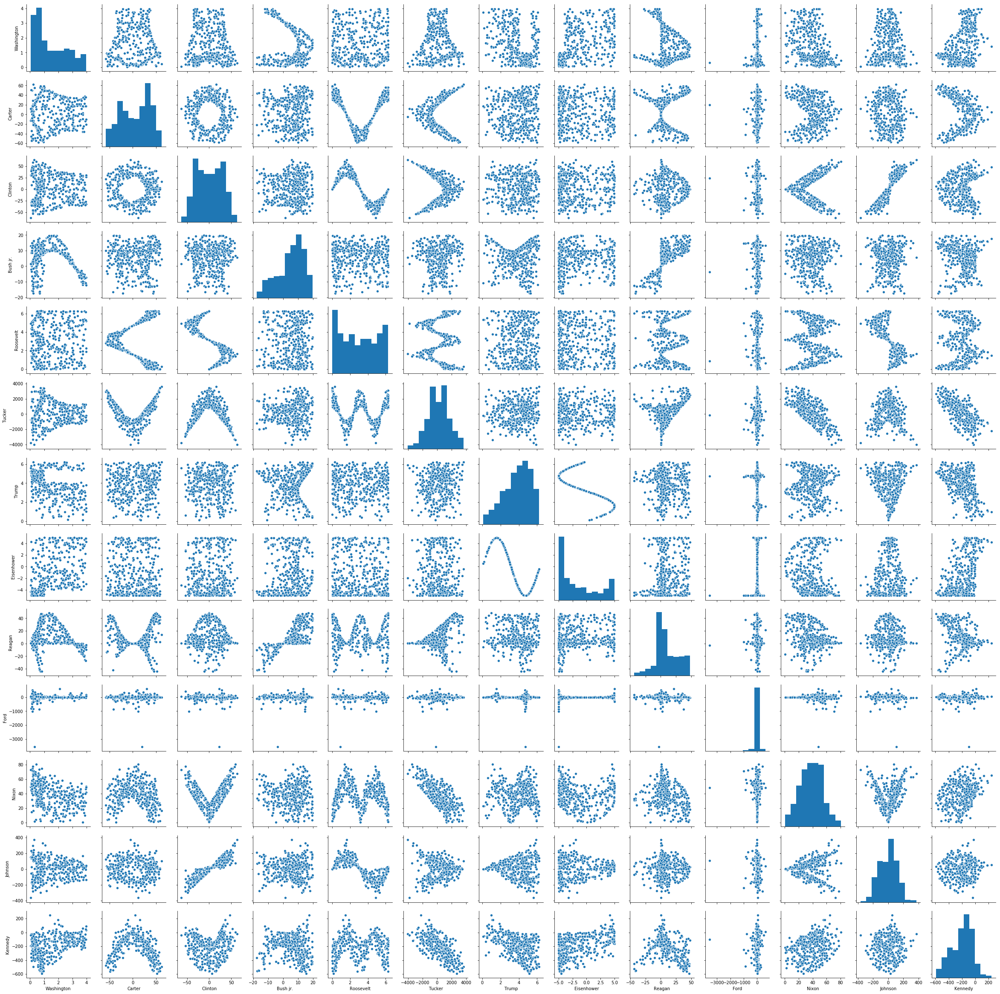

In [29]:
sns.pairplot(df)

Видим сложные нелинейные зависимости между признаками, а значит, нужно применять ядерный PCA. Но прежде уберем выброс в признаке Ford.

In [30]:
df.drop(df['Ford'].idxmin(), 0, inplace=True)

In [31]:
train_df = df.iloc[:-100]
test_df = df.iloc[-100:]

Здесь стоит задача не понижения размерности, а восстановления нелинейных зависимостей. Поэтому будем допускать число компонент, большее, чем число исходных признаков.

In [32]:
kernels = ['poly', 'rbf', 'linear']

comps = np.arange(2, 60, 1)

In [33]:
ridge = Ridge(alpha=0.0001, random_state=32)
scaler = StandardScaler()

X, y = train_df.drop('Washington', 1), train_df['Washington']
best_score = np.inf
best_model = None

for kernel in kernels:
    pca = decomp.KernelPCA(kernel=kernel, random_state=32)
    pipeline = Pipeline(steps=[('scaler', scaler),
                               ('pca', pca),
                               ('lr', model)])

    params = {
        'pca__n_components': comps if kernel != 'linear' else np.arange(2, 13, 1),
    } 
    gsearch = GridSearchCV(pipeline, params, scoring=rmse_scorer, cv=5, n_jobs=-1, iid=False)
    gsearch.fit(X, y)
    score = -gsearch.best_score_
    if score < best_score:
        best_score = score
        best_model = gsearch.best_estimator_
    print(kernel, ': score = ', score,
          'n_components = ', gsearch.best_params_['pca__n_components'])

poly : score =  0.6987828689552323 n_components =  58
rbf : score =  0.6416654075729065 n_components =  59
linear : score =  0.8145671779189592 n_components =  12


In [34]:
preds = best_model.fit(X, y).predict(test_df.drop('Washington', 1))
rmse(preds, test_df['Washington'])

0.5420664746917234

Лучше всего себя показало гауссово ядро. При этом понадобилось увеличить размерность пространства признаков.

# Задача 4

In [35]:
faces = fetch_olivetti_faces()

Датасет содержит по 10 фотографий каждого из 40 человек. Для удобства кластеризации будем рассматривать только 20 человек, а для проекции изображений - 5.

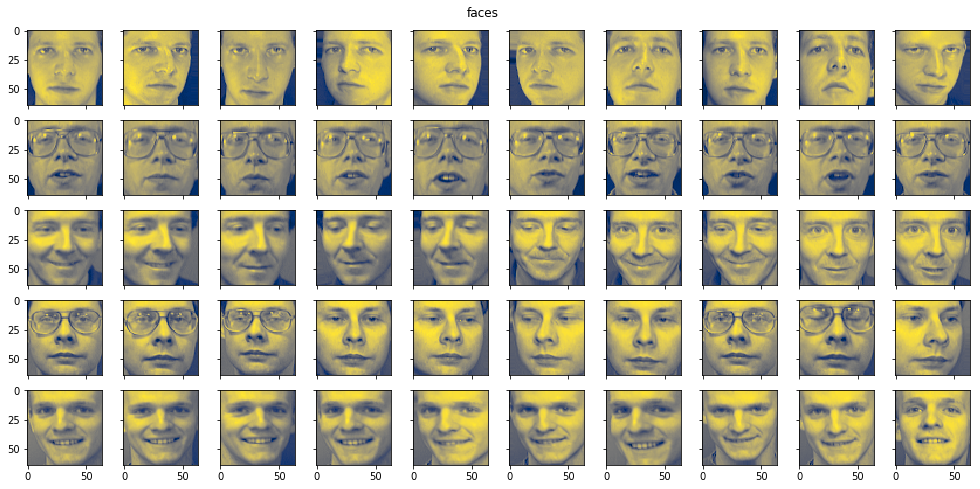

In [36]:
n_people = 5

def plot_faces(imgs, n_people=n_people, title='faces'):
    fig, axes = plt.subplots(n_people, 10, sharex='col', sharey='row', figsize=(17, 8))
    fig.suptitle(title, y=0.92)
    for i in range(n_people):
        for j in range(10):
            axes[i, j].imshow(imgs[10 * i + j], cmap='cividis')
            
plot_faces(faces.images)

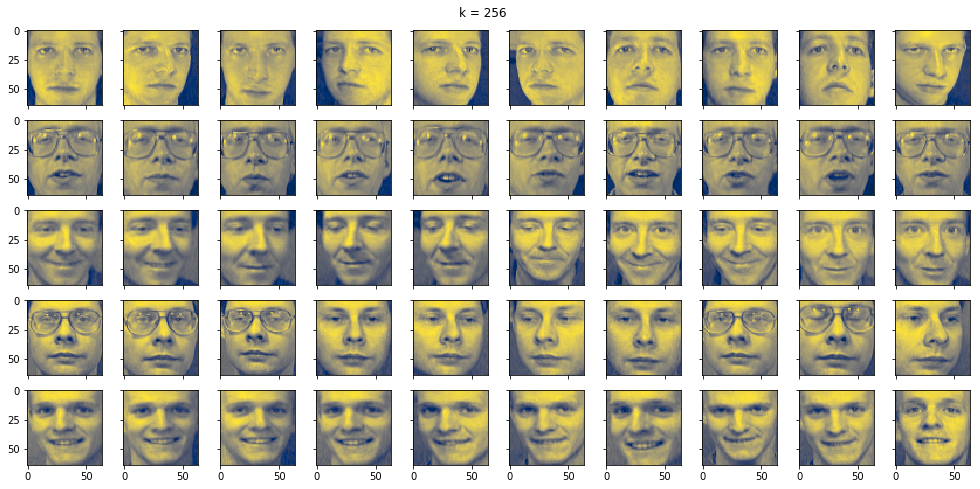

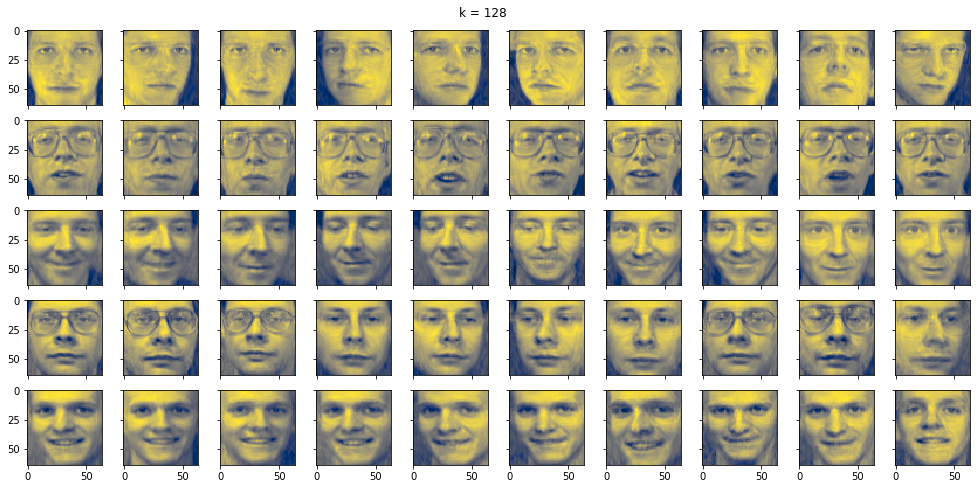

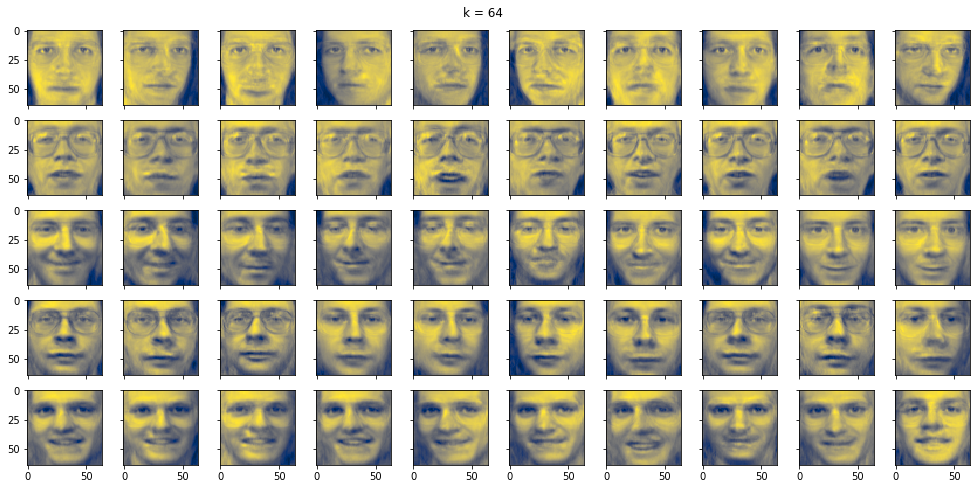

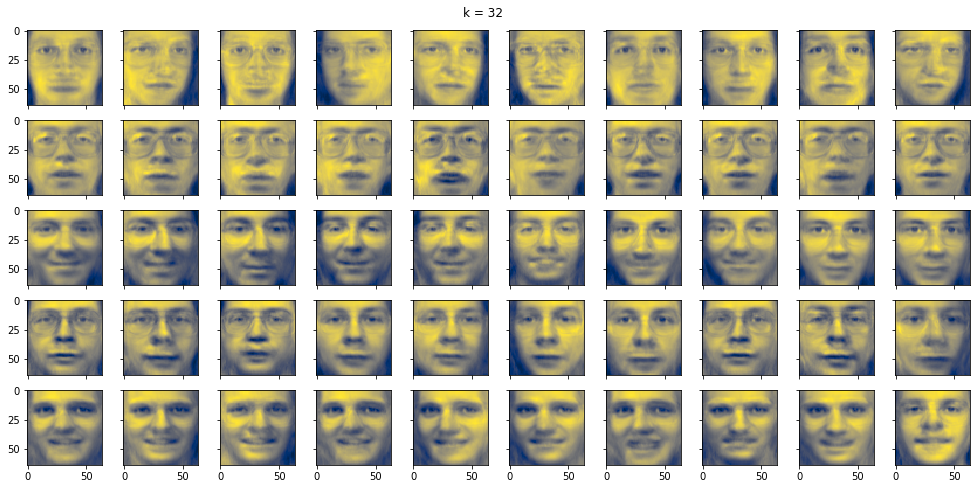

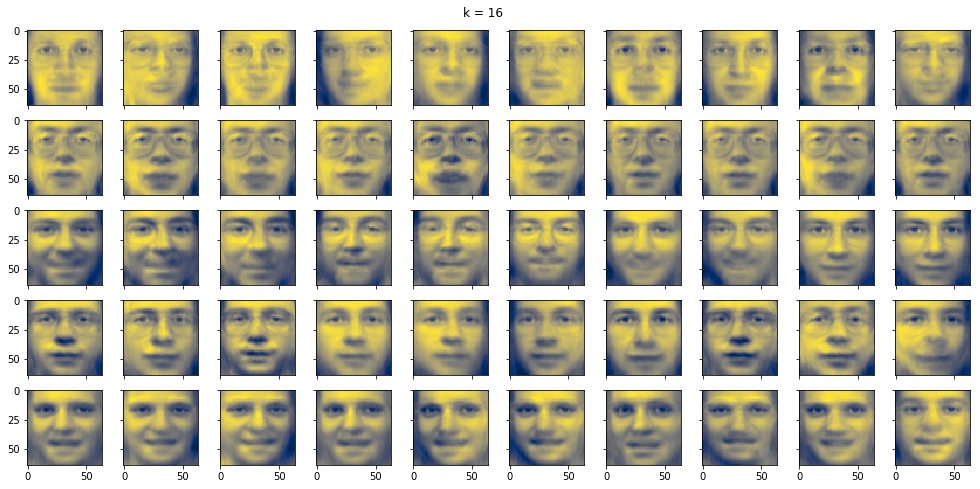

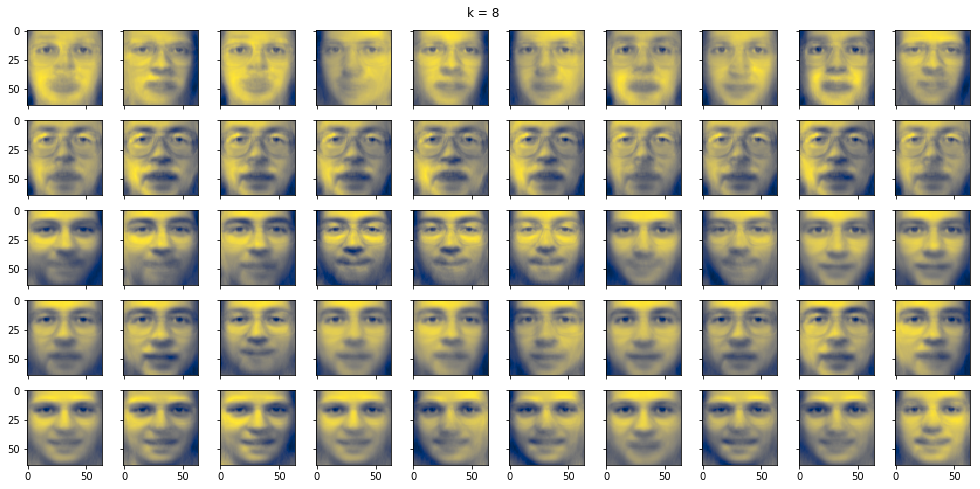

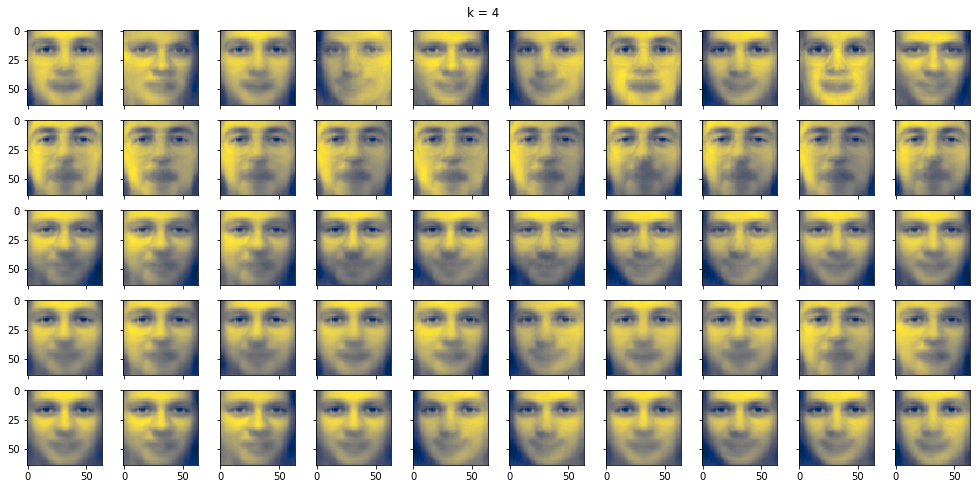

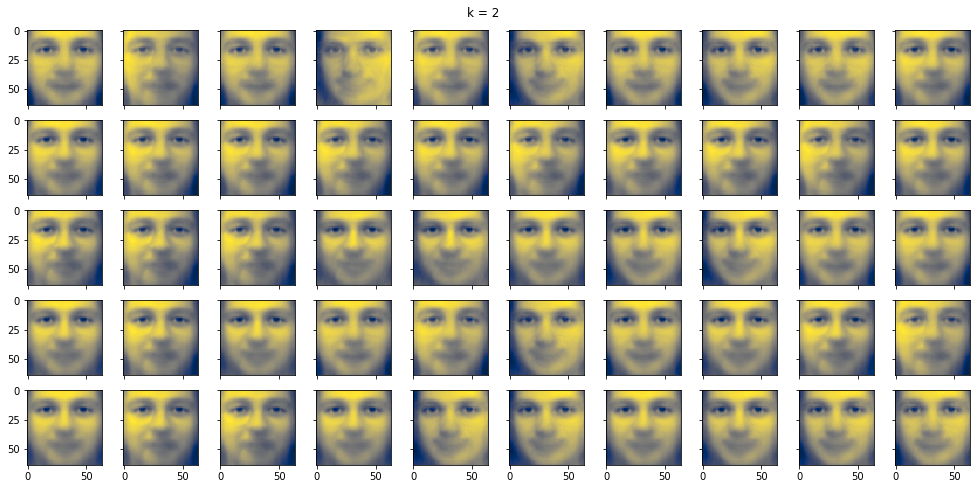

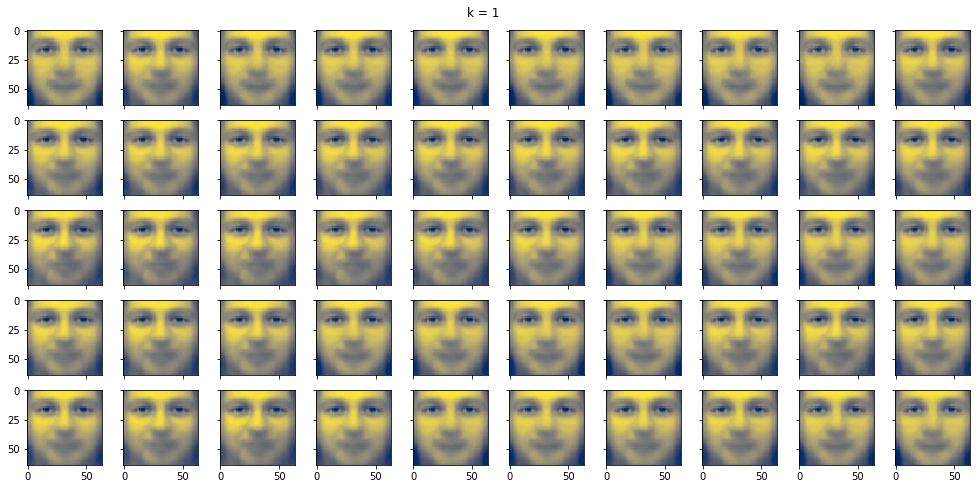

In [37]:
for k in np.logspace(8, 0, 9, base=2).astype('int'):
    pca = decomp.PCA(n_components=k)
    transformed = pca.fit_transform(faces.data)
    restored = pca.inverse_transform(transformed).reshape(-1, 64, 64)
    plot_faces(restored, title=f'k = {k}')

Различия начинают теряться при $k = 16$. При $k = 1$ все лица становятся одинаковыми, как и должно быть.

In [38]:
def scatter_labelled(data, labels):
    plt.figure(figsize=(12, 8))
    cmap = plt.cm.get_cmap('tab20', 20)

    sc = plt.scatter(data[:, 0], data[:, 1], c=labels, cmap=cmap)
    plt.colorbar(sc)
    plt.show()

In [39]:
faces20 = faces.data[:200]
labels20 = faces.target[:200]

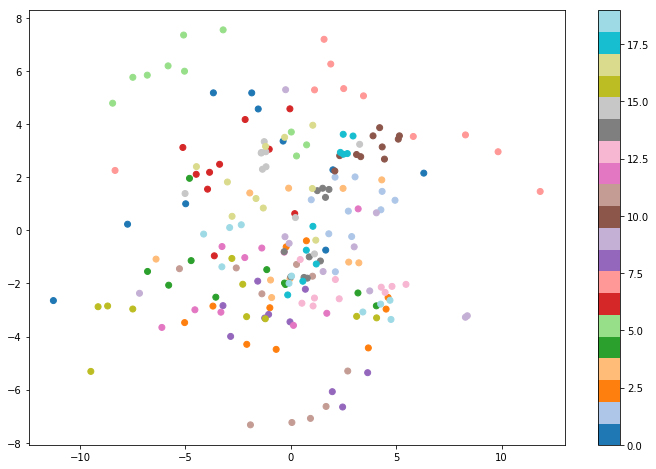

In [40]:
pca = decomp.PCA(n_components=2, random_state=15)
faces20_pca = pca.fit_transform(faces20)
scatter_labelled(faces20_pca, labels20)

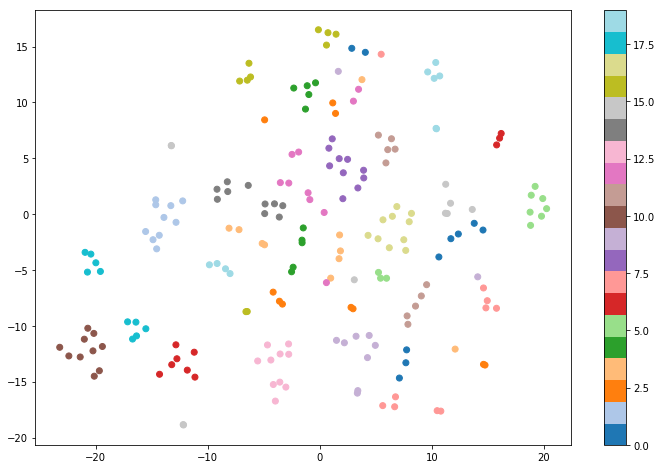

In [41]:
tsne = TSNE(n_components=2, perplexity=25)
faces20_tsne = tsne.fit_transform(faces20)
scatter_labelled(faces20_tsne, labels20)

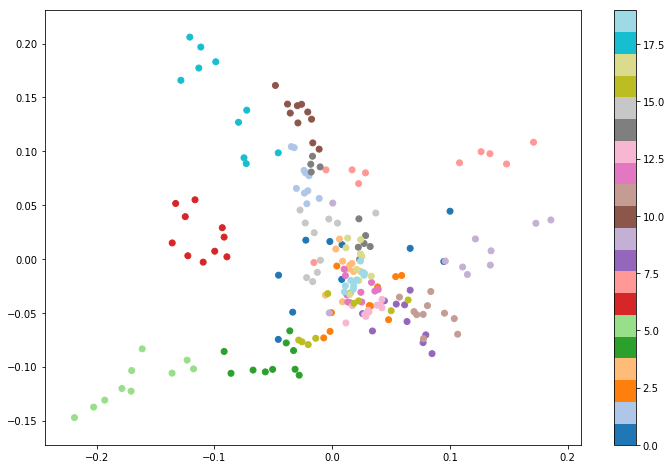

In [42]:
lle = LocallyLinearEmbedding(n_neighbors=18, n_components=2, eigen_solver='dense')
faces20_lle = lle.fit_transform(faces20)
scatter_labelled(faces20_lle, labels20)

PCA тут работает довольно плохо (потому что метод преобразует признаки "глобально"), а вот методы, основанные на локальном сходстве, позволяют заметить кластеры. t-SNE, как и ожидалось, показывает лучший результат - этот алгоритм специально построен так, чтобы результаты отражали похожесть объектов.

# Задача 5

In [104]:
df = pd.read_csv('hw11t5.csv', index_col=0)
df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
0,3.0,154.821499,5.782582,-3.918036,-1.400880,3.945351,2.815372,0.403212,-0.993077,0.191118,-12.357041,0.197025,-5.040347,1.056376e+25,0.946656,-80.043312
1,3.0,70.860971,3.590312,-0.640982,8.150033,0.770168,-7.692933,1.272137,-0.832262,0.211284,1.679167,-0.992891,0.838220,9.920627e+03,0.997701,8.345960
2,3.0,57.396471,2.232988,0.017323,4.791453,0.020102,0.555192,-5.698161,0.861783,-0.053746,1.403360,0.094688,9.101261,1.381784e+00,-0.288042,53.346486
3,2.0,187.208620,4.991852,-0.174600,8.288949,1.139516,3.626264,-10.823121,-0.153223,0.085406,-1.167043,0.617928,-0.247962,3.877774e+05,0.981043,57.129222
4,1.0,60.916377,4.928733,-2.434158,-0.227966,2.434237,6.837928,-4.609124,-0.999967,0.180764,-6.294473,-0.812003,1.231482,1.220270e+04,0.898770,-23.988305


In [105]:
len(df)

1000

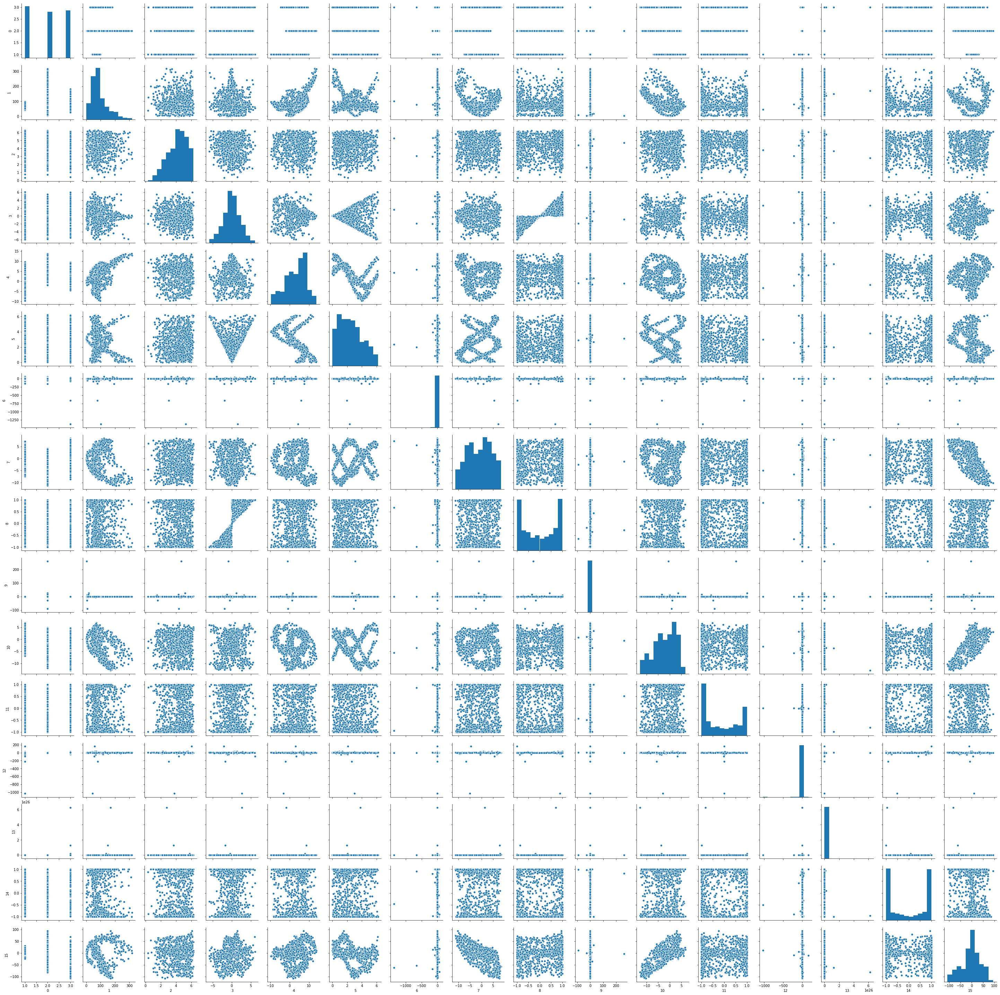

In [100]:
sns.pairplot(df)

Здесь нужно немного поработать с признаками. Признак 13 попробуем прологарифмировать, а из признаков 6, 9, 12 удалим выбросы.

In [114]:
df['13'] = np.log(df['13'])

In [124]:
sorted(df['6'])[:5]

[-1372.12255465,
 -662.162479373,
 -157.807283349,
 -140.399060111,
 -82.2052733904]

In [126]:
sorted(df['9'])[:5]

[-90.73081435879999,
 -27.5412308701,
 -6.45732231697,
 -6.454462996039999,
 -6.197350404040001]

In [128]:
sorted(df['9'], reverse=True)[:5]

[260.776874448, 26.2665095573, 13.9896713167, 8.71624558202, 5.84452884636]

In [129]:
sorted(df['12'])[:5]

[-1031.52129978,
 -222.351129269,
 -92.9379004978,
 -49.5870991617,
 -42.1213687495]

In [130]:
df.drop(df['6'].idxmin(), inplace=True)
df.drop(df['6'].idxmin(), inplace=True)
df.drop(df['9'].idxmin(), inplace=True)
df.drop(df['9'].idxmax(), inplace=True)
df.drop(df['12'].idxmin(), inplace=True)

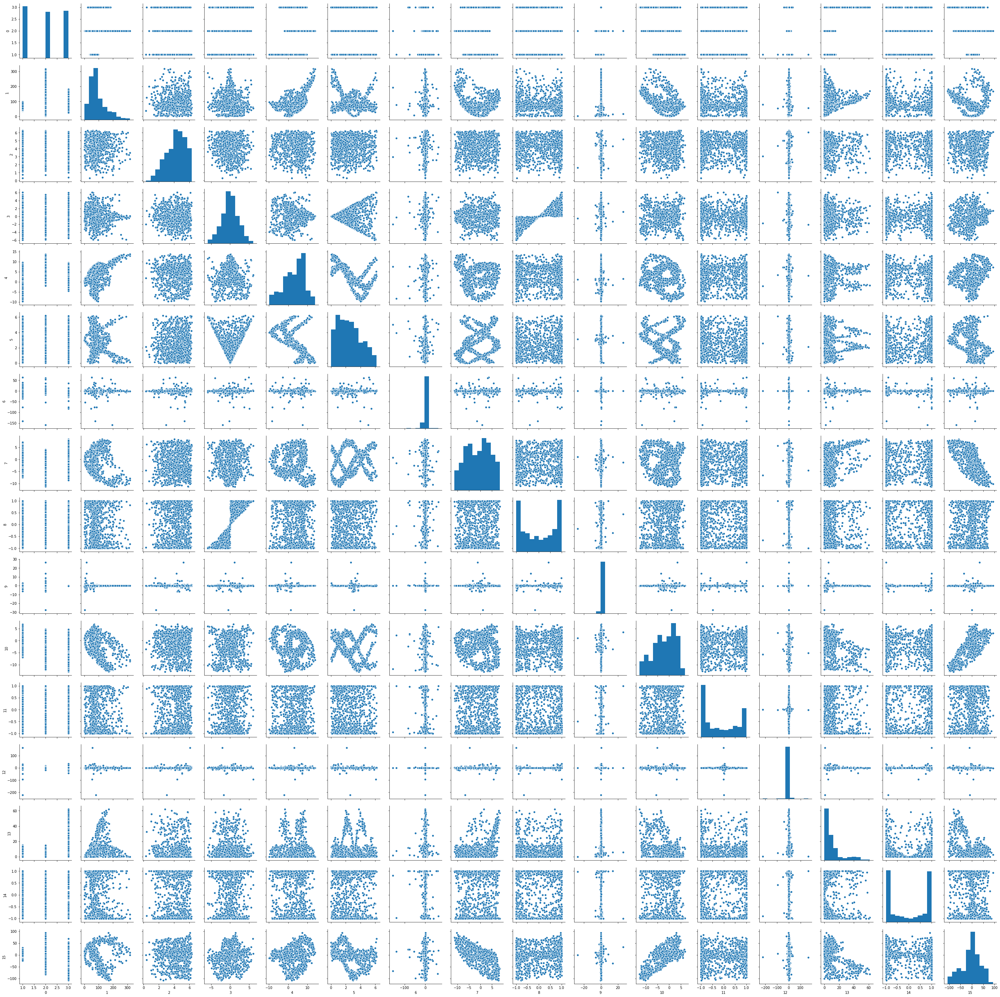

In [131]:
sns.pairplot(df)

Стало чуть лучше.

In [156]:
def scatter_3class(data, labels):
    plt.figure(figsize=(12, 8))
    cmap = plt.cm.get_cmap('Set2_r', 20)
    sc = plt.scatter(data[:, 0], data[:, 1], c=labels, cmap=cmap)
    plt.show()

In [163]:
def predict(transformer):
    X, y = df.drop('0', 1), df['0']
    X = transformer.fit_transform(X)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, stratify=y)
    scatter_3class(X_train, y_train)
    knn = KNeighborsClassifier(n_neighbors=10, weights='distance')
    knn.fit(X_train, y_train)
    acc = accuracy_score(y_test, knn.predict(X_test))
    print('Accuracy: ', acc)


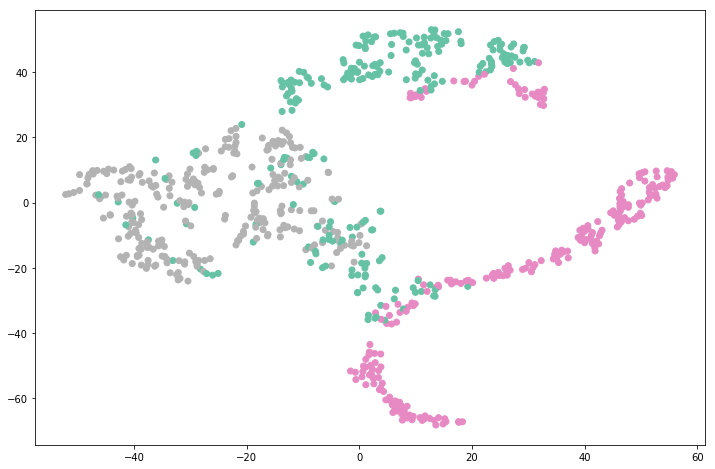

Accuracy:  0.9196787148594378


In [179]:
transformer = TSNE(n_components=2, perplexity=20, random_state=13)
predict(transformer)

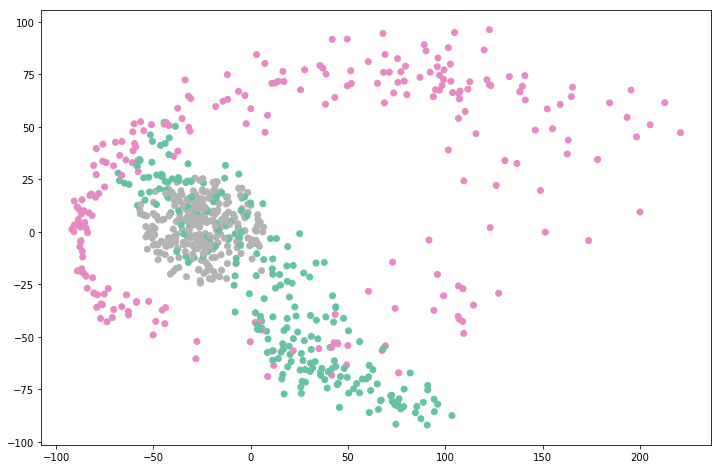

Accuracy:  0.8674698795180723


In [169]:
transformer = decomp.PCA(n_components=2, random_state=13)
predict(transformer)

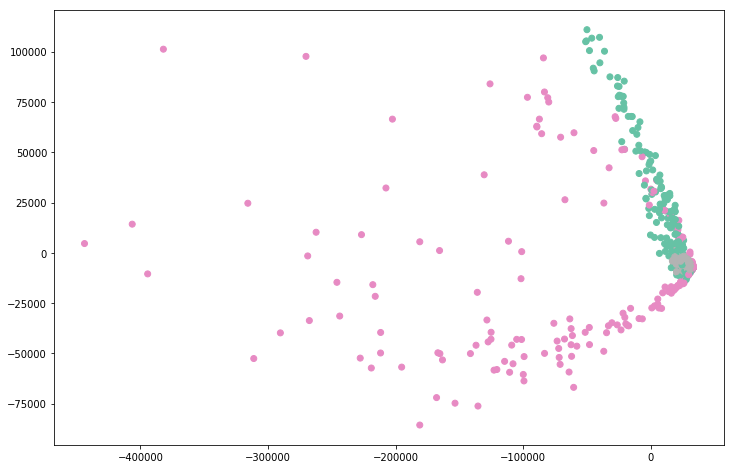

Accuracy:  0.8313253012048193


In [170]:
transformer = decomp.KernelPCA(n_components=2, kernel='poly', random_state=13)
predict(transformer)

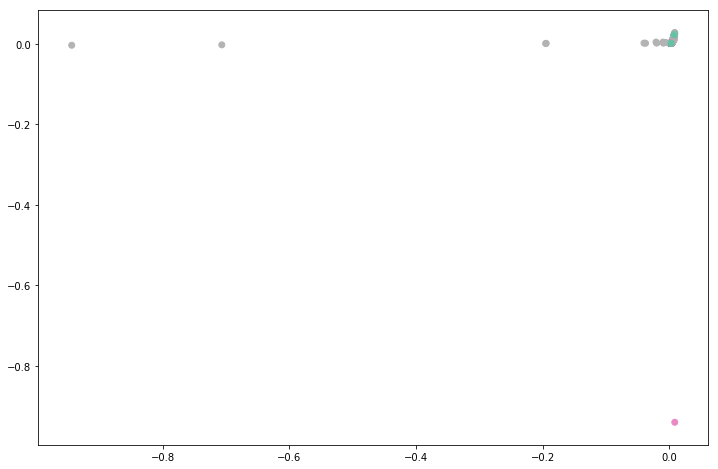

Accuracy:  0.43373493975903615


In [171]:
transformer = decomp.KernelPCA(n_components=2, kernel='rbf', random_state=13)
predict(transformer)

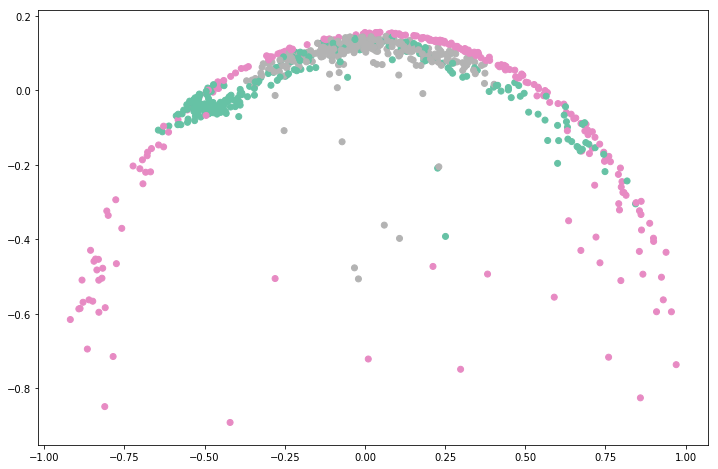

Accuracy:  0.8152610441767069


In [172]:
transformer = decomp.KernelPCA(n_components=2, kernel='cosine', random_state=13)
predict(transformer)

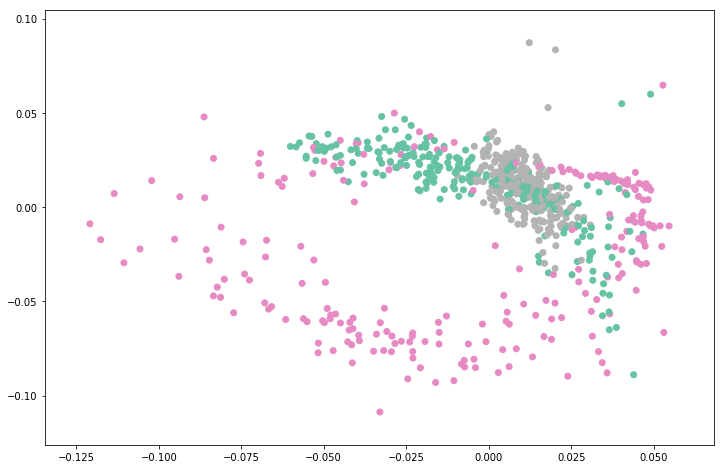

Accuracy:  0.8473895582329317


In [191]:
transformer = LocallyLinearEmbedding(n_neighbors=20, n_components=2, eigen_solver='dense', random_state=13)
predict(transformer)

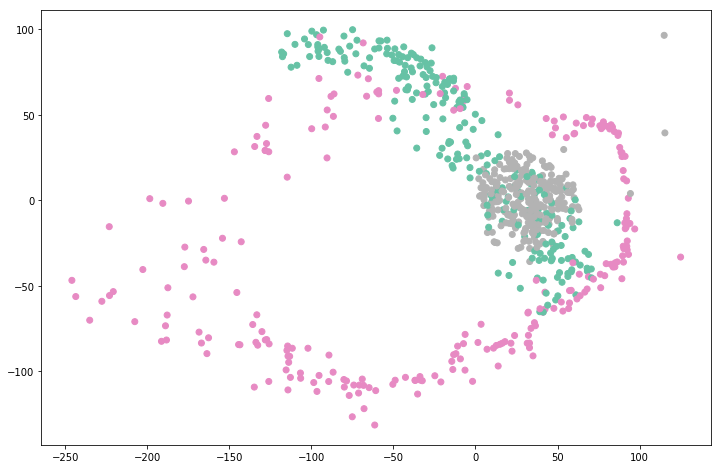

Accuracy:  0.8755020080321285


In [194]:
transformer = Isomap(n_neighbors=30, n_components=2, eigen_solver='dense')
predict(transformer)

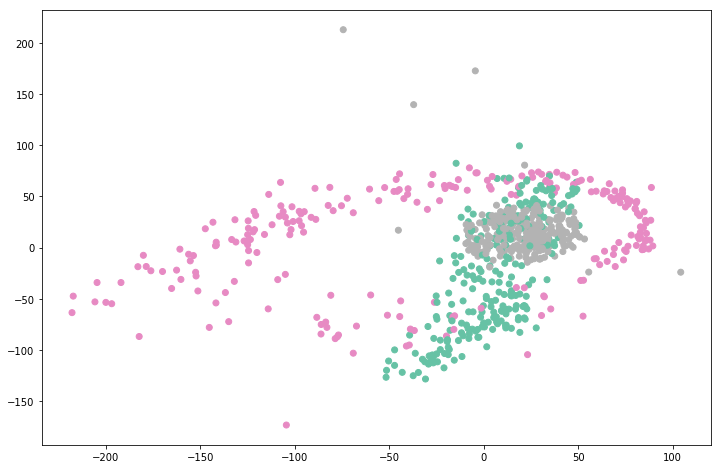

Accuracy:  0.8473895582329317


In [195]:
transformer = MDS(n_components=2, random_state=13)
predict(transformer)

Лучше всего с задачей справляется t-SNE, потому что лучше остальных отражает похожесть объектов (минимизирует отличие распределений). Также хорошие результаты показывают классический PCA (видимо, данные неплохо разделяются гиперплоскостями в исходном пространстве) и Isomap (потому что, как и kNN, использует ближайших соседей). Ядерные PCA тут работают не очень хорошо, наверное, данные плохо описываются такими ядрами. MDS и LLE показывают примерно одинаковые неплохие результаты - они минимизируют расстояния между объектами в новом пространстве, но более простыми способами, чем t-SNE и Isomap.